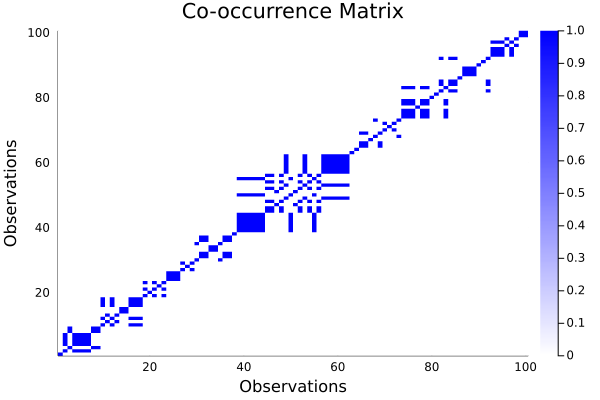

In [28]:
include("../ntl.jl")
import Random

using LinearAlgebra
Random.seed!(1)

data_covariance = Matrix{Float64}(0.1I, 2, 2)
prior_covariance = Matrix{Float64}(I, 2, 2)
prior_mean = Vector{Float64}(zeros(2))
data_parameters = Ntl.Models.GaussianParameters(data_covariance, prior_mean, prior_covariance)

psi_prior = Vector{Float64}([1, 1])
phi_prior = Vector{Float64}([1, 1])
geometric_arrival = Ntl.Models.GeometricArrivals(prior=phi_prior, sample_parameter_posterior=true)
ntl_cluster_parameters = Ntl.Models.NtlParameters(psi_prior, geometric_arrival, false)

mixture_model = Ntl.Models.Mixture(ntl_cluster_parameters, data_parameters)
n = 100
mixture = Ntl.Generate.generate(mixture_model, n=n)
data = Matrix(transpose(Matrix(mixture[:, 2:end])))
training_data = data[:, 1:n]
true_clustering = mixture[:, 1]
true_number_of_clusters = length(unique(true_clustering))
Ntl.Plot.plot_co_occurrence_matrix(true_clustering)

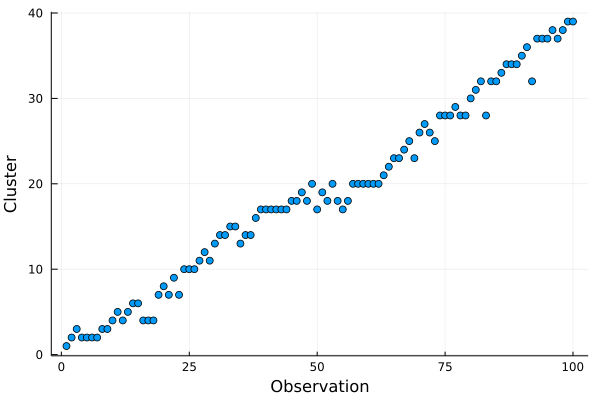

In [2]:
Ntl.Plot.plot_assignments(true_clustering)

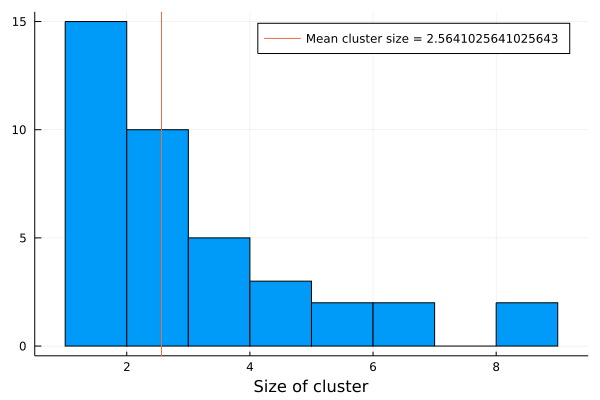

In [3]:
Ntl.Plot.plot_cluster_sizes_histogram(true_clustering)

In [4]:
ntl_cluster_parameters = Ntl.Models.NtlParameters(psi_prior, geometric_arrival)
gibbs_sampler = Ntl.Samplers.GibbsSampler(num_iterations=1000, num_burn_in=0, 
                                          assignment_types=["random", "all same cluster", "all different clusters"])
gibbs_output = Ntl.Fitter.fit(training_data, mixture_model, gibbs_sampler)

Progress: 100%|█████████████████████████████████████████| Time: 0:01:38
Progress: 100%|█████████████████████████████████████████| Time: 0:01:46
Progress: 100%|█████████████████████████████████████████| Time: 0:01:45


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 1 2 … 2 2; … ; 81 75 … 99 88; 74 100 … 100…
  "arrival posterior" => [0.106169 0.0122033 0.955306; 0.163669 0.0942852 0.983…
  "log likelihood"    => [-670.466 -428.843 -473.514; -689.292 -570.481 -473.51…

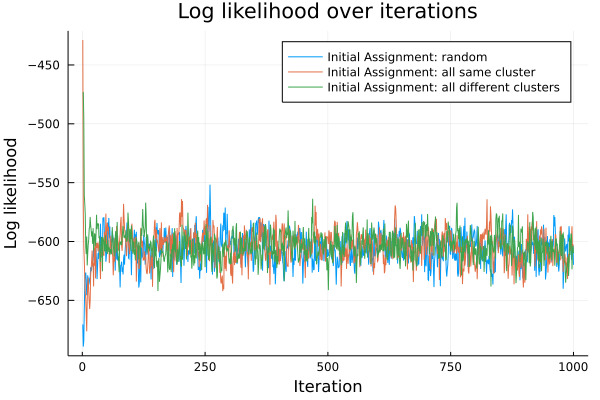

In [58]:
Ntl.Plot.plot_log_likelihoods(
    gibbs_output["log likelihood"],
    assignment_types=gibbs_sampler.assignment_types
)

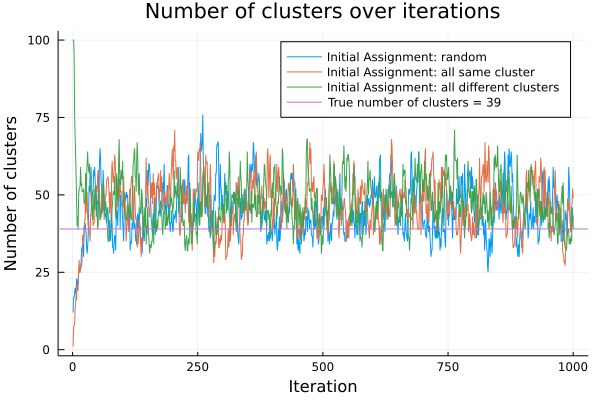

In [62]:
Ntl.Plot.plot_num_clusters(
    gibbs_output["assignments"], 
    true_number=true_number_of_clusters,
    assignment_types=gibbs_sampler.assignment_types
)

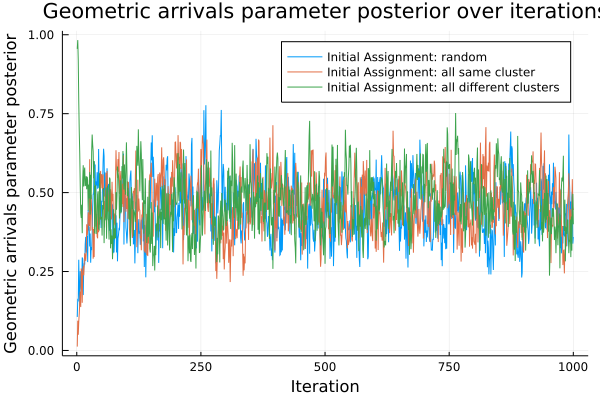

In [65]:
Ntl.Plot.plot_trace(
    gibbs_output["arrival posterior"], 
    ylabel="Geometric arrivals parameter posterior",
    assignment_types=gibbs_sampler.assignment_types
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


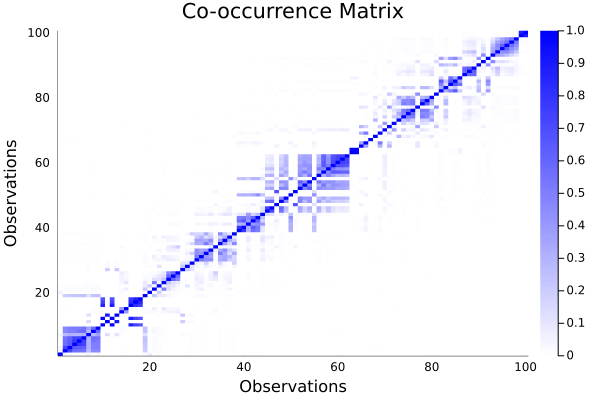

In [8]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_output["assignments"][:, :, 1], num_burn_in=0)

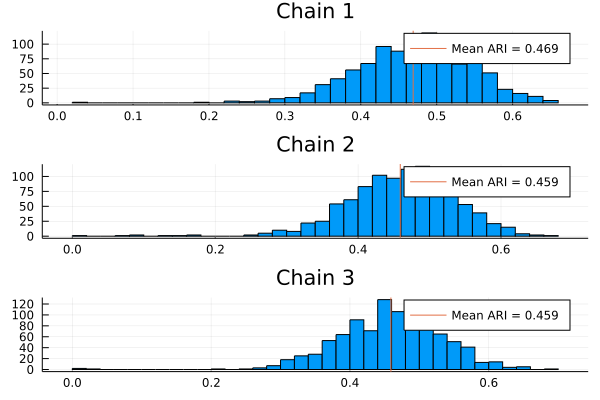

In [9]:
Ntl.Plot.plot_ari_posterior_distribution(true_clustering, gibbs_output["assignments"], num_burn_in=0)

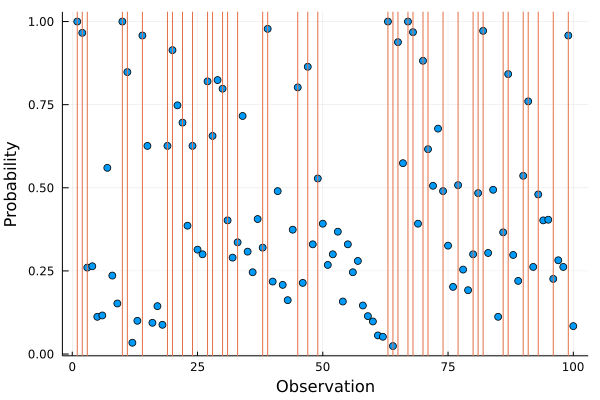

In [10]:
Ntl.Plot.plot_arrival_posterior_probabilities(gibbs_output["assignments"][:, :, 1], true_clustering, num_burn_in=500)

In [11]:
gibbs_map_estimate = Ntl.Utils.map_estimate(gibbs_output["assignments"][:, :, 1], gibbs_output["log likelihood"][:, 1], num_burn_in=500)
gibbs_map_ari = Ntl.Utils.adjusted_rand_index(gibbs_map_estimate, true_clustering)
println("MAP Estimate ARI = $gibbs_map_ari")

MAP Estimate ARI = 0.3990142188261889


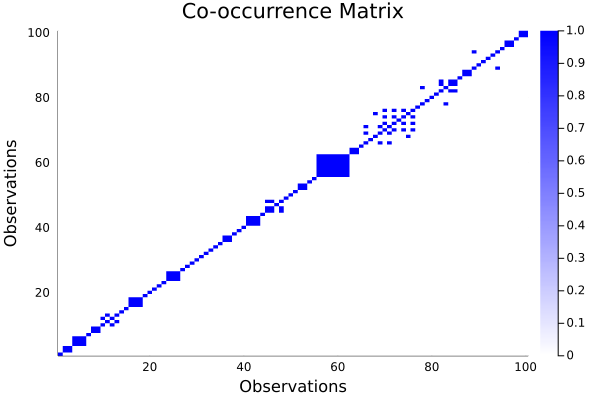

In [12]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_map_estimate)

In [13]:
gibbs_minbinder_estimate = Ntl.Utils.minbinder(gibbs_output["assignments"][:, :, 1], num_burn_in=500)
gibbs_minbinder_ari = Ntl.Utils.adjusted_rand_index(gibbs_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $gibbs_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:00
┌ Warning: RCall.jl: Loading required package: lpSolve
└ @ RCall /Users/seanla/.julia/packages/RCall/3mHXJ/src/io.jl:160


MinBinder estimate ARI = 0.40205957258332403


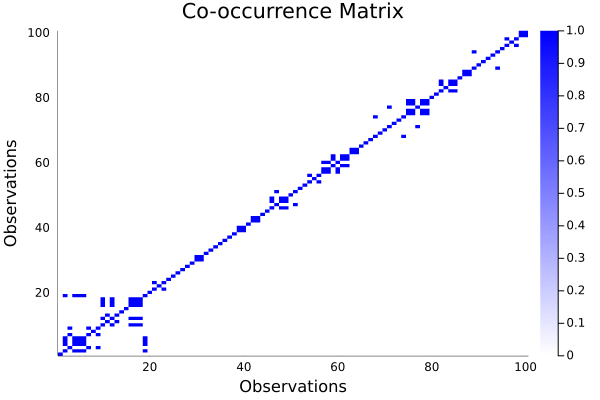

In [14]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_minbinder_estimate)

In [15]:
gibbs_minVI_estimate = Ntl.Utils.minVI(gibbs_output["assignments"][:, :, 1], num_burn_in=500)
gibbs_minVI_ari = Ntl.Utils.adjusted_rand_index(gibbs_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $gibbs_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


Min VI Estimate ARI = 0.6248928696449908


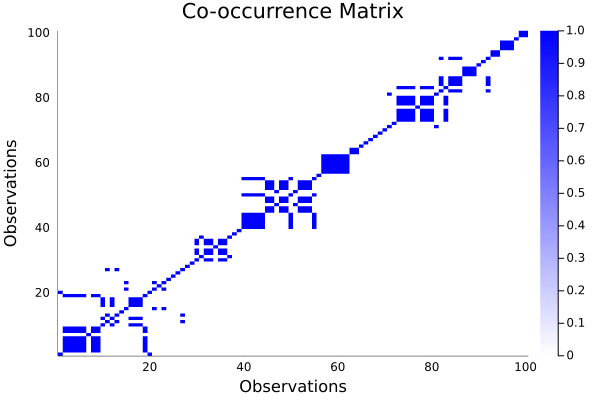

In [16]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_minVI_estimate)

In [17]:
metropolis_hastings_sampler = Ntl.Samplers.MetropolisHastingsSampler(num_iterations=100000, num_burn_in=0, proposal_radius=5, skip=1, adaptive=false,
                                                                     assignment_types=["random", "all same cluster", "all different clusters"])
mcmc_output = Ntl.Fitter.fit(training_data, mixture_model, metropolis_hastings_sampler) 


Progress: 100%|█████████████████████████████████████████| Time: 0:03:01
Progress: 100%|█████████████████████████████████████████| Time: 0:03:01
Progress: 100%|█████████████████████████████████████████| Time: 0:02:55


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 1 1 … 2 2; … ; 99 89 … 99 99; 65 89 … 99 9…
  "arrival posterior" => [0.0973485 0.00787297 0.991172; 0.170933 0.102117 0.97…
  "log likelihood"    => [-586.981 -428.843 -473.514; -618.475 -538.433 -479.60…

In [18]:
Ntl.Plot.plot_log_likelihoods(mcmc_output["log likelihood"])

In [19]:
Ntl.Plot.plot_num_clusters(mcmc_output["assignments"], true_number=true_number_of_clusters)

In [20]:
Ntl.Plot.plot_trace(mcmc_output["arrival posterior"], ylabel="Geometric Arrivals Posterior")

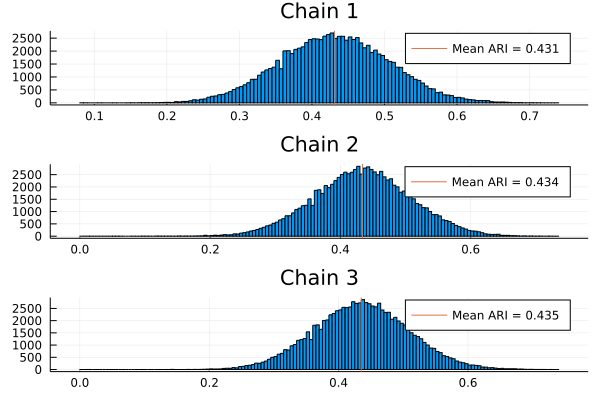

In [21]:
Ntl.Plot.plot_ari_posterior_distribution(true_clustering, mcmc_output["assignments"], num_burn_in=0)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:52


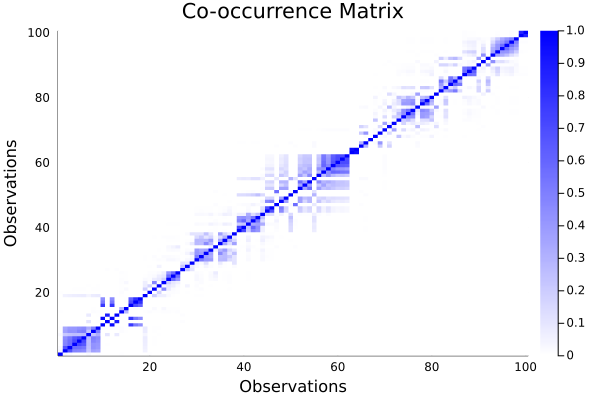

In [22]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_output["assignments"][:, :, 1])

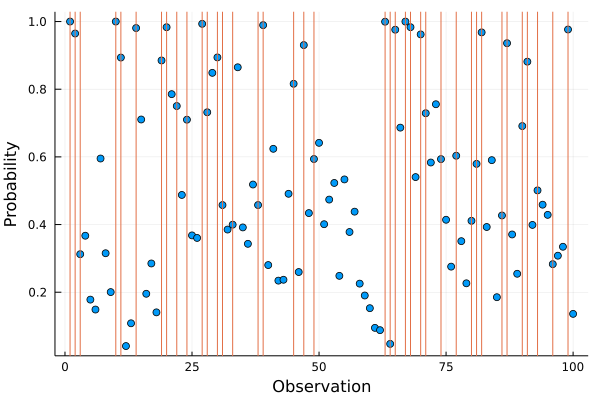

In [23]:
Ntl.Plot.plot_arrival_posterior_probabilities(mcmc_output["assignments"][:, :, 1], true_clustering, num_burn_in=0)

In [24]:
mcmc_map_estimate = Ntl.Utils.map_estimate(mcmc_output["assignments"][:, :, 1], mcmc_output["log likelihood"][:, 1], num_burn_in=0)
mcmc_map_ari = Ntl.Utils.adjusted_rand_index(mcmc_map_estimate, true_clustering)
println("MAP Estimate ARI = $mcmc_map_ari")

MAP Estimate ARI = 0.15359840721438267


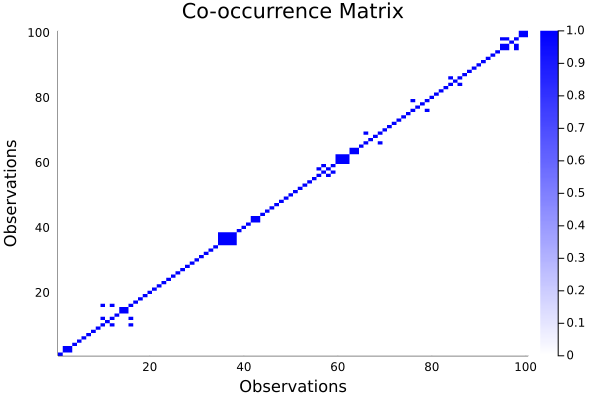

In [25]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_map_estimate)

In [26]:
mcmc_minbinder_estimate = Ntl.Utils.minbinder(mcmc_output["assignments"][:, :, 1], num_burn_in=2600)
mcmc_minbinder_ari = Ntl.Utils.adjusted_rand_index(mcmc_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $mcmc_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:54


MinBinder estimate ARI = 0.368604853076422


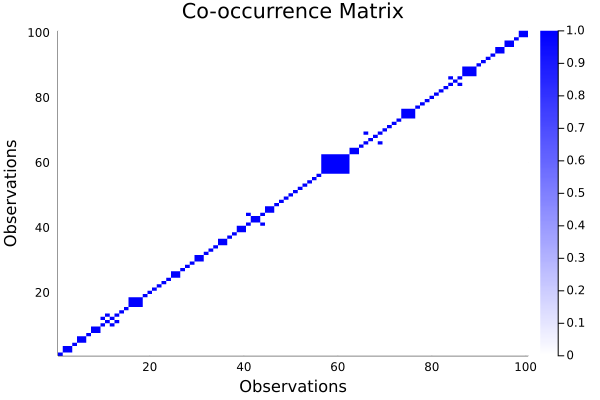

In [27]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_minbinder_estimate)

In [28]:
mcmc_minVI_estimate = Ntl.Utils.minVI(mcmc_output["assignments"][:, :, 1], num_burn_in=2600)
mcmc_minVI_ari = Ntl.Utils.adjusted_rand_index(mcmc_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $mcmc_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:52


Min VI Estimate ARI = 0.5169377711755064


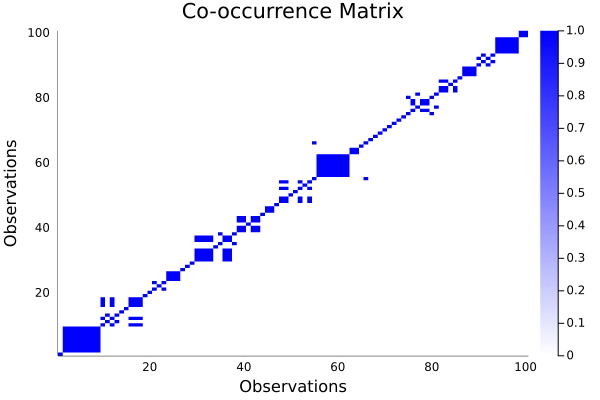

In [29]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_minVI_estimate)

In [40]:
dp_cluster_parameters = Ntl.Models.DpParameters(1, sample_parameter_posterior=false)
dp_mixture = Ntl.Models.Mixture(dp_cluster_parameters, data_parameters)
gibbs_sampler = Ntl.Samplers.GibbsSampler(num_iterations=10000, num_burn_in=0, 
                                          assignment_types=["random", "all same cluster", "all different clusters"])
dp_output = Ntl.Fitter.fit(training_data, dp_mixture, gibbs_sampler)


Progress: 100%|█████████████████████████████████████████| Time: 0:00:28
Progress: 100%|█████████████████████████████████████████| Time: 0:00:27
Progress: 100%|█████████████████████████████████████████| Time: 0:00:27


Dict{String, Array} with 2 entries:
  "assignments"    => [1 1 … 1 1; 1 2 … 2 2; … ; 84 87 … 28 39; 11 87 … 28 39]…
  "log likelihood" => [-691.329 -428.843 -832.648; -726.361 -627.629 -786.006; …

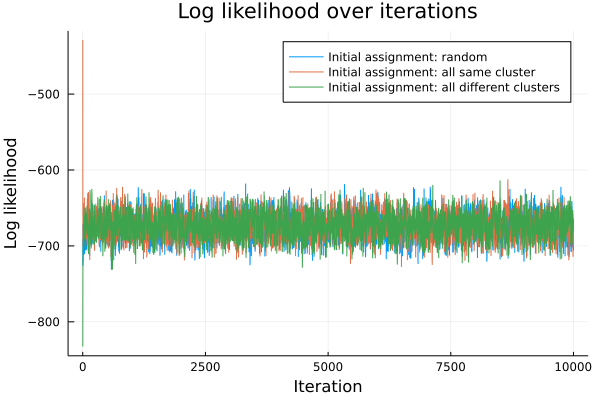

In [41]:
Ntl.Plot.plot_log_likelihoods(
    dp_output["log likelihood"],
    assignment_types=gibbs_sampler.assignment_types
)

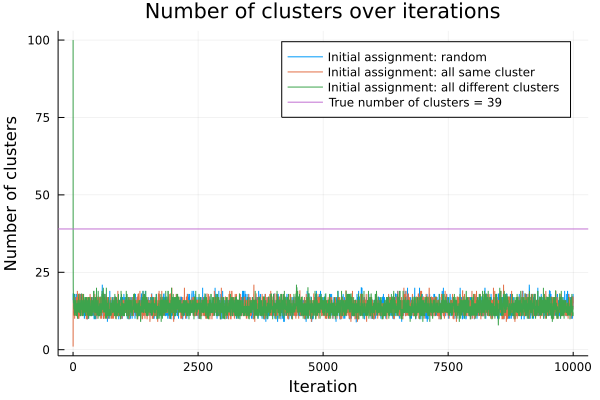

In [42]:
Ntl.Plot.plot_num_clusters(
    dp_output["assignments"],
    true_number=true_number_of_clusters,
    assignment_types=gibbs_sampler.assignment_types
)

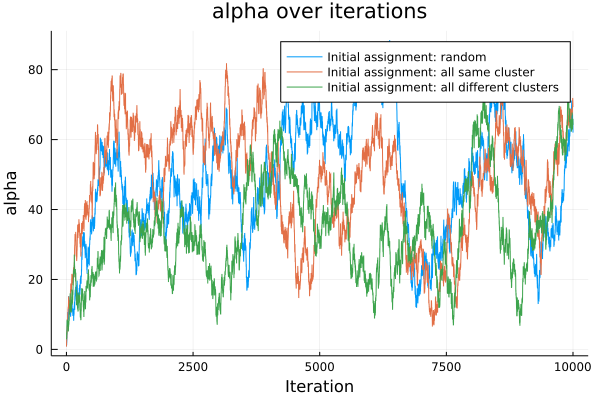

In [32]:
Ntl.Plot.plot_trace(
    dp_output["cluster parameter"],
    ylabel="alpha",
    assignment_types=gibbs_sampler.assignment_types
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


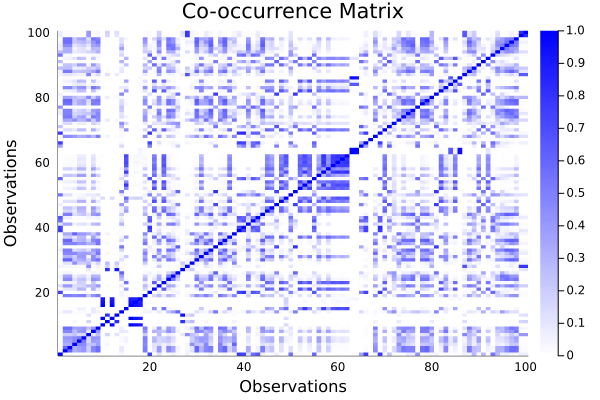

In [43]:
Ntl.Plot.plot_co_occurrence_matrix(dp_output["assignments"][:, :, 1], num_burn_in=1000)

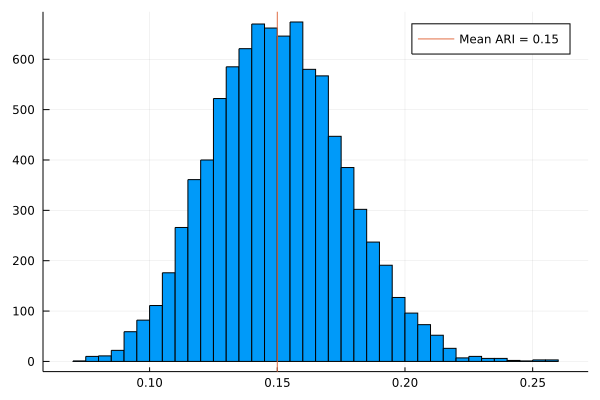

In [44]:
Ntl.Plot.plot_ari_posterior_distribution(true_clustering, dp_output["assignments"][:, :, 1], num_burn_in=1000)

In [45]:
dp_map_estimate = Ntl.Utils.map_estimate(dp_output["assignments"][:, :, 1], dp_output["log likelihood"][:, 1], num_burn_in=1000)
dp_map_ari = Ntl.Utils.adjusted_rand_index(dp_map_estimate, true_clustering)
println("MAP Estimate ARI = $dp_map_ari")

MAP Estimate ARI = 0.12891945845602232


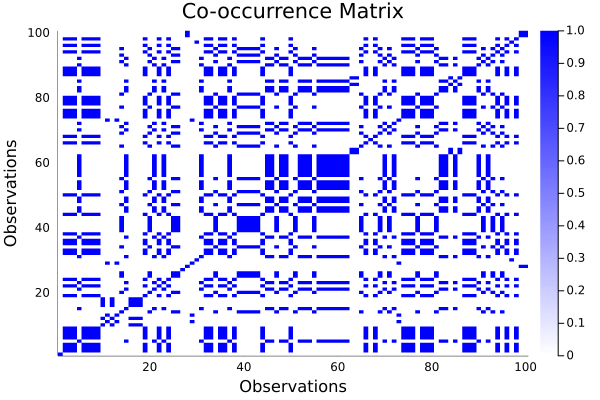

In [46]:
Ntl.Plot.plot_co_occurrence_matrix(dp_map_estimate)

In [ ]:
dp_minbinder_estimate = Ntl.Utils.minbinder(dp_output["assignments"][:, :, 1], num_burn_in=1000)
dp_minbinder_ari = Ntl.Utils.adjusted_rand_index(dp_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $dp_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


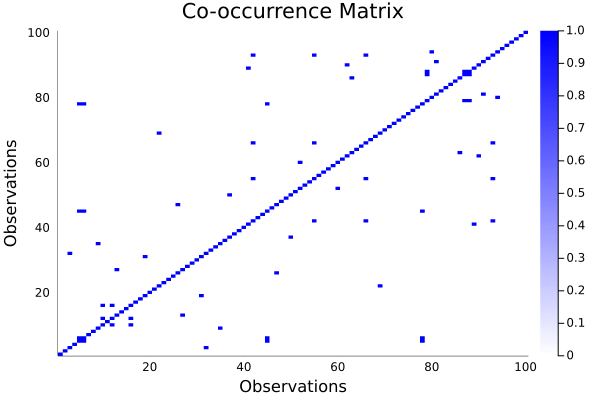

In [39]:
Ntl.Plot.plot_co_occurrence_matrix(dp_minbinder_estimate)

In [39]:
dp_minVI_estimate = Ntl.Utils.minVI(dp_output["assignments"][:, :, 1], num_burn_in=1000)
dp_minVI_ari = Ntl.Utils.adjusted_rand_index(dp_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $dp_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:04


Min VI Estimate ARI = 0.13451856065993473


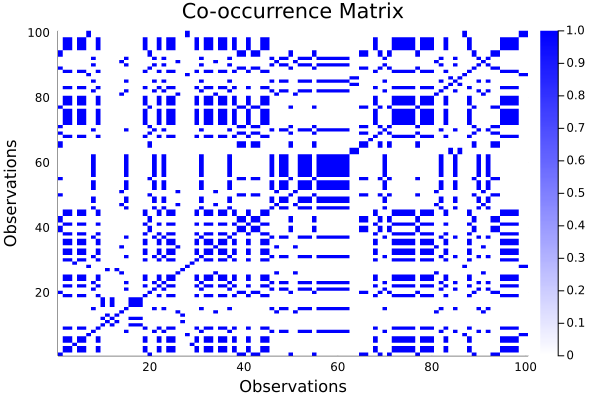

In [40]:
Ntl.Plot.plot_co_occurrence_matrix(dp_minVI_estimate)

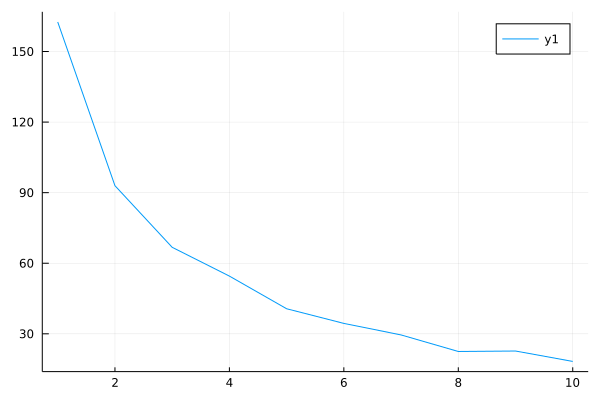

In [41]:
Ntl.Plot.plot_kmeans_elbow(training_data, max_num_clusters=10)

In [47]:
using Clustering
kmeans_num_clusters = 6
final_kmeans_result = kmeans(training_data, kmeans_num_clusters)
kmeans_clustering = final_kmeans_result.assignments

100-element Vector{Int64}:
 2
 1
 1
 5
 1
 1
 5
 1
 1
 4
 5
 4
 5
 ⋮
 1
 6
 2
 6
 2
 1
 1
 1
 1
 1
 5
 5

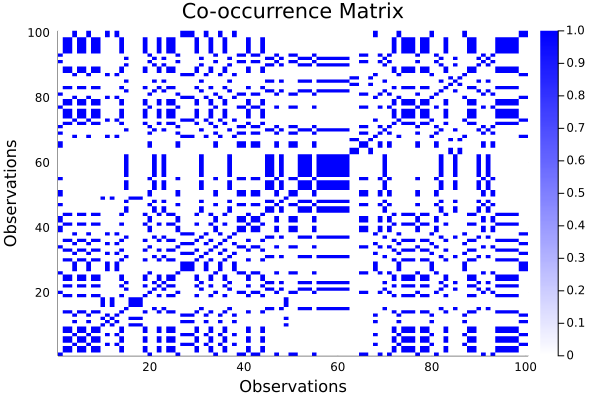

In [48]:
Ntl.Plot.plot_co_occurrence_matrix(kmeans_clustering)

In [49]:
kmeans_ari = Ntl.Utils.adjusted_rand_index(kmeans_clustering, true_clustering)
print("K-means clustering ARI = $kmeans_ari")

K-means clustering ARI = 0.13005367370708776